# EDA for Football Data from Transfermarkt
- Kaggle Data URL

    - https://www.kaggle.com/datasets/davidcariboo/player-scores

## 데이터 설명


- `csv` 파일 설명
    - `apperances` : 선수 출장 기록
    - `club_games` : 클럽별 경기 홈팀, 어웨이팀 정보
    - `clubs` : 리그별 속해 있는 클럽
    - `competitions` : 대회 정보
    - `game_events` : 경기별 이벤트 정보 (카드, 득점, 어시스트 등)
    - `game_lineups` : 경기별 선수의 선발, 교체 명단 등재 여부
    - `games` : 경기에 대한 정보 (시즌, 라운드, 홈팀, 어웨이팀, 순위)
    - `player_valuations` : Transfermarkt 웹사이트에서 매긴 선수의 가치
    - `players` : 선수에 대한 세부 정보


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

from datetime import datetime
from datetime import timedelta
import missingno as msno

import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

import warnings
warnings.filterwarnings(action='ignore')


In [2]:
import plotly.io as pio

pio.renderers.default = "svg"

In [3]:
# 데이터 경로
path = "data/df_preprocessed.csv"
df = pd.read_csv(path)

In [4]:
df.head()

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,total_apps,competition_code,is_major_national_league,date_of_birth,position,current_club_name,highest_market_value,market_value_per_season,country,foot,height_in_cm
0,Aaron Connolly,2019,0,0,3,2,1261,24,premier-league,True,2000-01-28,Centre-Forward,Brighton & Hove Albion,7000000.0,4000000.0,Ireland,right,174.0
1,Aaron Connolly,2020,0,0,2,1,791,17,premier-league,True,2000-01-28,Centre-Forward,Brighton & Hove Albion,7000000.0,7000000.0,Ireland,right,174.0
2,Aaron Connolly,2021,0,0,0,0,155,4,premier-league,True,2000-01-28,Centre-Forward,Brighton & Hove Albion,7000000.0,6000000.0,Ireland,right,174.0
3,Aaron Cresswell,2019,7,0,3,0,2730,31,premier-league,True,1989-12-15,Left-Back,West Ham United,12000000.0,6500000.0,England,left,170.0
4,Aaron Cresswell,2020,3,0,0,8,3172,36,premier-league,True,1989-12-15,Left-Back,West Ham United,12000000.0,5000000.0,England,left,170.0


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16360 entries, 0 to 16359
Data columns (total 18 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   player_name               16360 non-null  object 
 1   start_season              16360 non-null  int64  
 2   yellow_cards              16360 non-null  int64  
 3   red_cards                 16360 non-null  int64  
 4   goals                     16360 non-null  int64  
 5   assists                   16360 non-null  int64  
 6   minutes_played            16360 non-null  int64  
 7   total_apps                16360 non-null  int64  
 8   competition_code          16360 non-null  object 
 9   is_major_national_league  16360 non-null  bool   
 10  date_of_birth             16360 non-null  object 
 11  position                  16360 non-null  object 
 12  current_club_name         16360 non-null  object 
 13  highest_market_value      16360 non-null  float64
 14  market

In [6]:
# date_of_birth 컬럼 타입 datetime으로 변경
df["date_of_birth"] = pd.to_datetime(df["date_of_birth"], format='%Y-%m-%d')

In [7]:
# 시즌별 만 나이 구하는 함수 생성
def calculate_age(born_col, season_col):
    today = datetime.today()
    # 생일이 지나지 않았다면 현재 연도 - 태어난 연도 - 1년 더 빼준다
    age = today.year - born_col.year - ((today.month, today.day) < (born_col.month, born_col.day))
    # return age, season_col

    # 23-24 시즌
    if season_col == (today.year-1):
        return age
    # 22-23 시즌
    elif season_col == (today.year-2):
        return age-1
    # 21-22 시즌
    elif season_col == (today.year-3):
        return age-2
    # 20-21 시즌
    elif season_col == (today.year-4):
        return age-3
    # 19-20 시즌
    else :
        return age-4
    

In [8]:
# 시즌별 만 나이 구하는 함수 적용
df["age"] = df.apply(lambda row : calculate_age(row["date_of_birth"], row["start_season"]), axis=1)

In [9]:
# start_season 컬럼 타입 object로 변경
df["start_season"] = df["start_season"].astype(str)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16360 entries, 0 to 16359
Data columns (total 19 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   player_name               16360 non-null  object        
 1   start_season              16360 non-null  object        
 2   yellow_cards              16360 non-null  int64         
 3   red_cards                 16360 non-null  int64         
 4   goals                     16360 non-null  int64         
 5   assists                   16360 non-null  int64         
 6   minutes_played            16360 non-null  int64         
 7   total_apps                16360 non-null  int64         
 8   competition_code          16360 non-null  object        
 9   is_major_national_league  16360 non-null  bool          
 10  date_of_birth             16360 non-null  datetime64[ns]
 11  position                  16360 non-null  object        
 12  current_club_name 

In [11]:
df = df[['player_name', 'start_season', 'yellow_cards', 'red_cards', 'goals',
         'assists', 'minutes_played', 'total_apps', 'competition_code',
         'date_of_birth', 'age', 'position', 'current_club_name', 'highest_market_value', 'market_value_per_season', 'country', 'foot', 'height_in_cm']]

In [12]:
df.head(3)

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,total_apps,competition_code,date_of_birth,age,position,current_club_name,highest_market_value,market_value_per_season,country,foot,height_in_cm
0,Aaron Connolly,2019,0,0,3,2,1261,24,premier-league,2000-01-28,20,Centre-Forward,Brighton & Hove Albion,7000000.0,4000000.0,Ireland,right,174.0
1,Aaron Connolly,2020,0,0,2,1,791,17,premier-league,2000-01-28,21,Centre-Forward,Brighton & Hove Albion,7000000.0,7000000.0,Ireland,right,174.0
2,Aaron Connolly,2021,0,0,0,0,155,4,premier-league,2000-01-28,22,Centre-Forward,Brighton & Hove Albion,7000000.0,6000000.0,Ireland,right,174.0


### `.describe()` 확인

In [13]:
df.describe()

,yellow_cards,red_cards,goals,assists,minutes_played,total_apps,date_of_birth,age,highest_market_value,market_value_per_season,height_in_cm
count,16360.000000,16360.000000,16360.000000,16360.000000,16360.000000,16360.000000,16360,16360.000000,1.636000e+04,1.636000e+04,16360.000000
mean,2.738264,0.072433,1.711491,1.327995,1254.192787,19.035024,1995-10-23 10:26:26.112469504,26.392298,1.678695e+07,9.197272e+06,182.510330
min,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1977-09-13 00:00:00,16.000000,5.000000e+04,2.500000e+04,162.000000
25%,0.000000,0.000000,0.000000,0.000000,360.000000,9.000000,1992-07-08 00:00:00,23.000000,3.000000e+06,1.200000e+06,178.000000
50%,2.000000,0.000000,0.000000,0.000000,1139.000000,20.000000,1996-02-26 12:00:00,26.000000,9.000000e+06,3.500000e+06,183.000000
75%,4.000000,0.000000,2.000000,2.000000,2031.000000,29.000000,1999-04-10 00:00:00,29.000000,2.200000e+07,1.000000e+07,187.000000
max,18.000000,3.000000,41.000000,22.000000,3420.000000,39.000000,2008-03-10 00:00:00,43.000000,2.000000e+08,1.800000e+08,206.000000
std,2.767398,0.275002,3.205116,2.123027,957.716879,11.255929,NaN,4.454786,2.199751e+07,1.472348e+07,6.641245


In [14]:
df.describe(include="object")

,player_name,start_season,competition_code,position,current_club_name,country,foot
count,16360,16360,16360,16360,16360,16360,16360
unique,6249,5,6,13,282,129,3
top,Paulinho,2020,serie-a,Centre-Back,Newcastle United,Spain,right
freq,17,3390,3067,2925,171,2039,11612


### 분포 확인

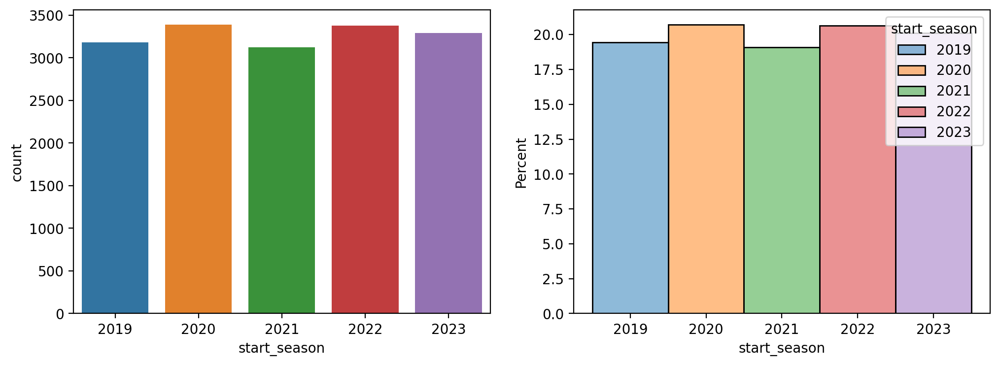

In [15]:
# season별 데이터 숫자 분포 확인
# 숫자 count, 비율도 함께 확인

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

g1 = sns.countplot(data=df, x="start_season", hue="start_season", ax=axes[0])
g2 = sns.histplot(data=df, x="start_season", hue="start_season", stat="percent", ax=axes[1])


## 이상치 확인
- `boxplot` 그려서 확인

In [16]:
# num_cols = df.select_dtypes(include="number").columns.drop("last_season").tolist()
num_cols = df.select_dtypes(include="number").columns.tolist()

print(num_cols)
print(len(num_cols))

['yellow_cards', 'red_cards', 'goals', 'assists', 'minutes_played', 'total_apps', 'age', 'highest_market_value', 'market_value_per_season', 'height_in_cm']
10


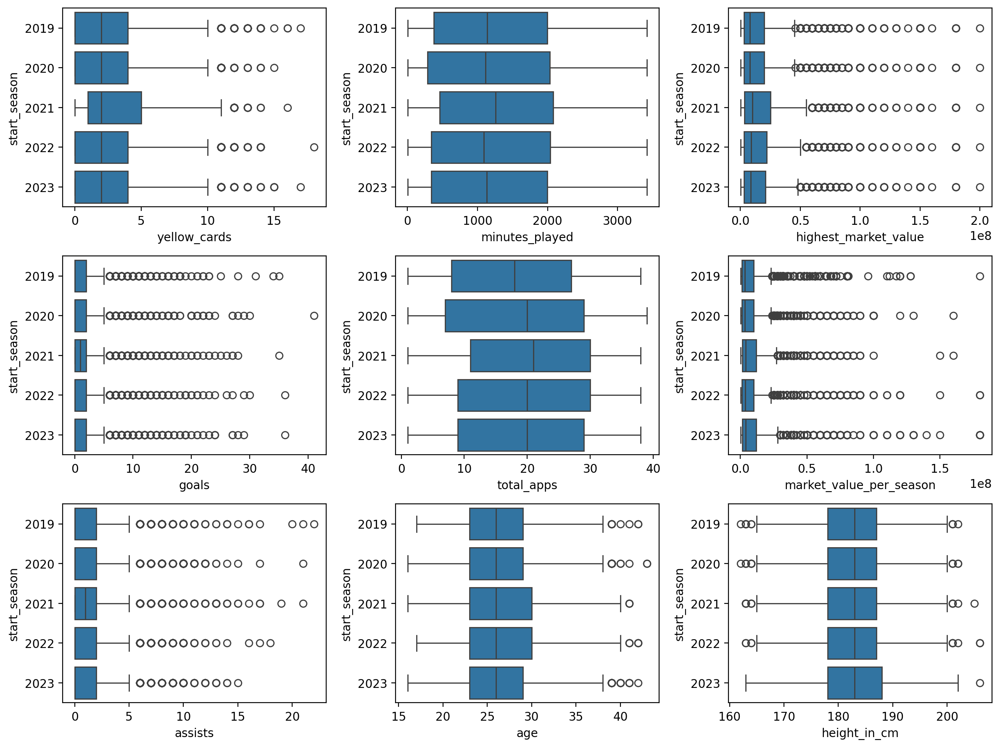

In [17]:
# num_cols에서 red_cards 제거한 것 num_cols2에 선언

num_cols2 = ['yellow_cards', 'goals', 'assists', 'minutes_played', 'total_apps', 'age', 'highest_market_value', 'market_value_per_season', 'height_in_cm']

# subplot 생성
nrows, ncols = 3, 3
fig, axes = plt.subplots(nrows, ncols, figsize=(12, 9))

# flatten()을 통해 axes를 1차원 array로 펴줘야 한다
axes = axes.T.flatten()

for col, ax in zip(num_cols2, axes):
    sns.boxplot(data=df, x=col, ax=ax, y="start_season")
    # sns.stripplot(data=df, x=col, ax=ax, y="last_season", hue="foot")

fig.tight_layout()
plt.show()

### 이상치 확인 결과
- 전반적으로 `start_season`에 따라 비슷한 결과

- `goals`, `assists`, `market_value` 등 다양한 곳에서 이상치 존재
    - 그러나 축구라는 스포츠의 특성 상, 득점, 도움, 시장 가치 등 몇몇의 특출난 선수들의 스탯이 도드라지게 나타난다
- 결론 : 이상치 따로 처리하지 않음

## Pairplot 확인

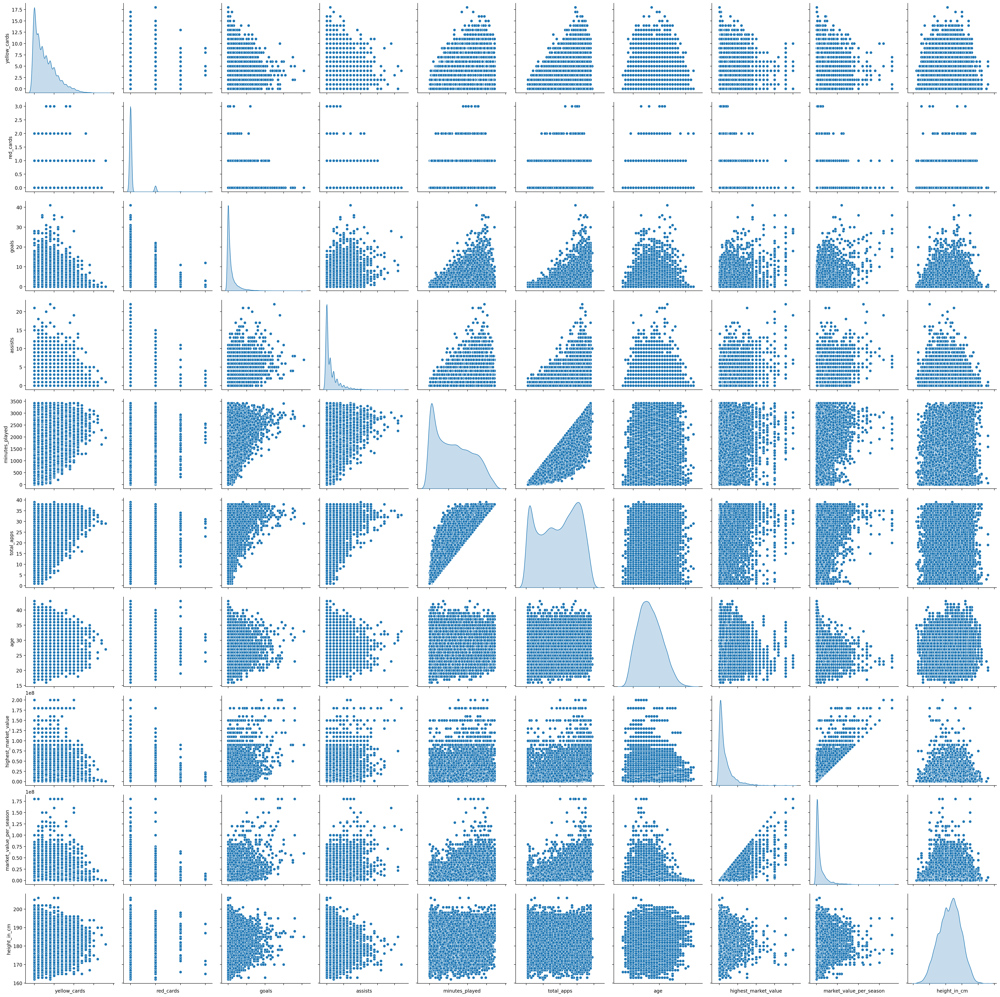

In [18]:
g = sns.pairplot(df, palette = 'seismic', diag_kind = 'kde', size=3)
g.set(xticklabels=[])

## 상관관계 확인

In [19]:
df_corr = df[num_cols].corr()

df_corr.style.background_gradient()

,yellow_cards,red_cards,goals,assists,minutes_played,total_apps,age,highest_market_value,market_value_per_season,height_in_cm
yellow_cards,1.000000,0.132223,0.193393,0.257628,0.624602,0.610226,0.143913,0.125452,0.170756,-0.003402
red_cards,0.132223,1.000000,0.033420,0.039611,0.133962,0.126852,0.055942,0.006905,0.010527,0.018953
goals,0.193393,0.033420,1.000000,0.564064,0.398572,0.441158,0.068867,0.422777,0.467943,-0.055791
assists,0.257628,0.039611,0.564064,1.000000,0.452416,0.493243,0.056160,0.409261,0.449170,-0.205136
minutes_played,0.624602,0.133962,0.398572,0.452416,1.000000,0.918099,0.224305,0.293333,0.364226,0.072072
total_apps,0.610226,0.126852,0.441158,0.493243,0.918099,1.000000,0.199074,0.287012,0.338560,-0.022311
age,0.143913,0.055942,0.068867,0.056160,0.224305,0.199074,1.000000,0.010179,-0.128118,0.068115
highest_market_value,0.125452,0.006905,0.422777,0.409261,0.293333,0.287012,0.010179,1.000000,0.837909,-0.024708
market_value_per_season,0.170756,0.010527,0.467943,0.449170,0.364226,0.338560,-0.128118,0.837909,1.000000,-0.009540
height_in_cm,-0.003402,0.018953,-0.055791,-0.205136,0.072072,-0.022311,0.068115,-0.024708,-0.009540,1.000000


<Axes: >

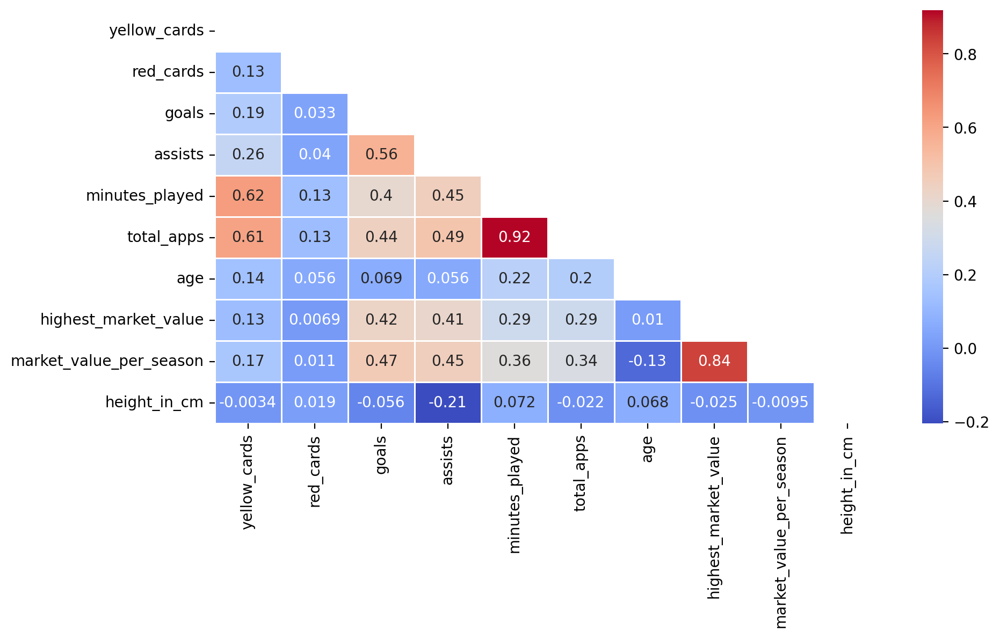

In [20]:
plt.figure(figsize=(10,5))

# 삼각형 마스크를 만든다(위 쪽 삼각형에 True, 아래 삼각형에 False)
mask = np.zeros_like(df_corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(df_corr,
            annot=True,         # 실제 값을 표시한다
            mask=mask,          # 표시하지 않을 마스크 부분을 지정한다
            linewidths=.5,      # 경계면 실선으로 구분하기
            cmap='coolwarm')

### 상관관계 결과
- 매우 강한 상관관계 (0.8 이상)
    - `minutes_played` - `total_apps`
    - `highest_market_value` - `market_value_per_season`
- 강한 상관관계 (0.6 ~ 0.8)
    - `yellow_cards` - `minutes_played`
    - `yellow_cards` - `total_apps`
- 뚜렷한 상관관계 (0.4 ~ 0.6)
    - `goals` - `market_value_per_season`
    - `goals` - `highest_market_value`
    - `goals` - `total_apps`
    - `goals` - `minutes_played`
    - `goals` - `assists`
    - `assists` - `market_value_per_season`
    - `assists` - `highest_market_value`
    - `assists` - `total_apps`
    - `assists` - `minutes_played`
- 약한 상관관계 (0.2 ~ 0.4)
    - `market_value_per_season` - `minutes_played`
    - `market_value_per_season` - `total_apps`
    - `age` - `minutes_played`
- 음의 상관관계 (-0.2 ~)
    - `assists` - `height_in_cm`

#### 상관관계 높은 변수들 분포 확인
- 상관관계가 높은 변수 관계 4가지 분포 시각화해본다

    - 매우 강한 상관관계 (0.8 이상)
        - `minutes_played` - `total_apps`
        - `highest_market_value` - `market_value_per_season`
    - 강한 상관관계 (0.6 ~ 0.8)
        - `yellow_cards` - `minutes_played`
    - 뚜렷한 상관관계 (0.4 ~ 0.6)
        - `goals` - `market_value_per_season`

In [21]:
# 상관관계 높은 변수들끼리 짝지워 high_corr에 선언
high_corr = {"minutes_played" : "total_apps", 
             "highest_market_value" : "market_value_per_season",
             "yellow_cards" : "minutes_played", 
             "goals" : "market_value_per_season"}
high_corr

{'minutes_played': 'total_apps',
 'highest_market_value': 'market_value_per_season',
 'yellow_cards': 'minutes_played',
 'goals': 'market_value_per_season'}

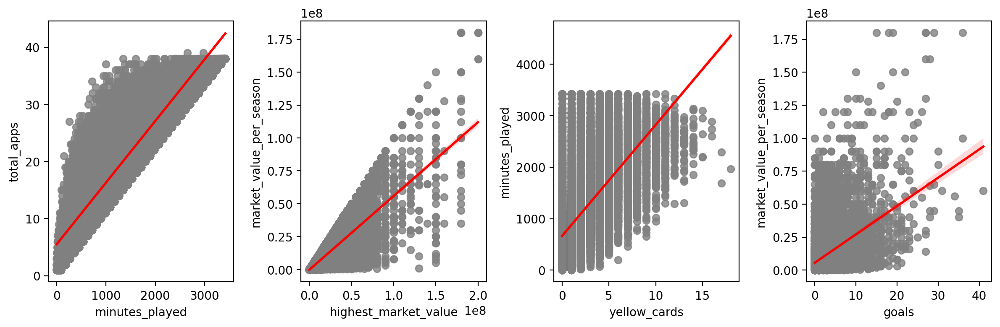

In [22]:
# 상관관계 분포 시각화
# subplot 생성
nrows, ncols = 1, 4
fig, axes = plt.subplots(nrows, ncols, figsize=(12, 4))

# flatten()을 통해 axes를 1차원 array로 펴줘야 한다
axes = axes.T.flatten()

# regplot 그려서 추세선과 상관관계 확인
for key, ax in zip(high_corr, axes):
    sns.regplot(x=df[f"{key}"],
                y=df[high_corr[f"{key}"]],
                ax=ax,
                scatter_kws={"color":"gray"},
                line_kws={"color":"red", "lw":2})

fig.tight_layout()
plt.show()

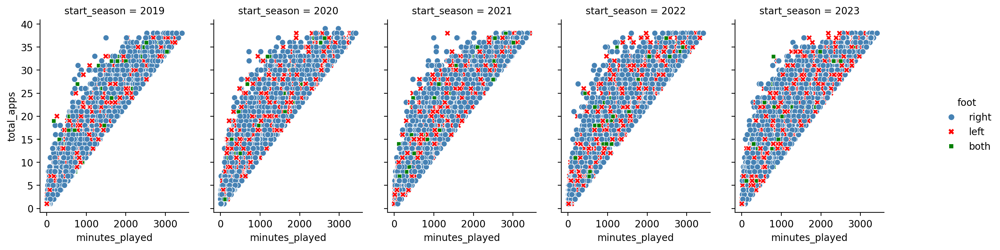

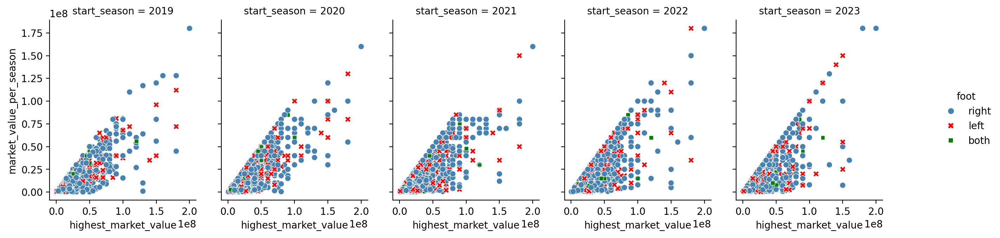

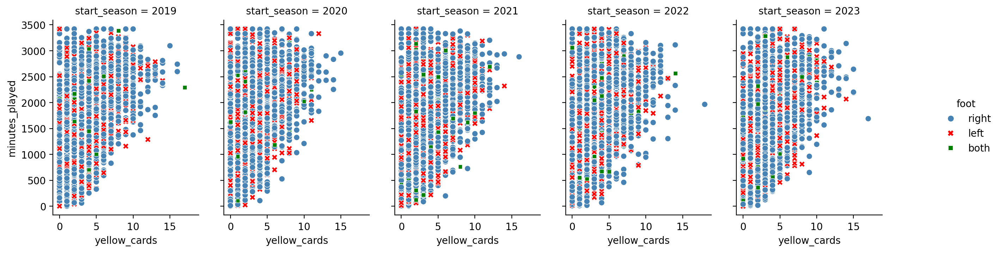

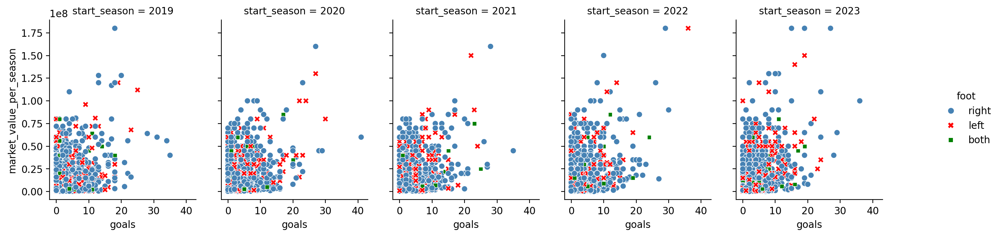

In [23]:
# sns.relplot 통해 상관계수 높은 컬럼들이 start_season에 따라 어떻게 분포가 달라지는지 확인
# 전체적으로 비슷한 모습 보인다

g1 = sns.relplot(data=df,
                 x="minutes_played",
                 y="total_apps",
                 col="start_season",
                 hue="foot",
                 style="foot", height=3, aspect=.5,
                 palette=["steelblue", "r", "g"])

g2 = sns.relplot(data=df,
                 x="highest_market_value",
                 y="market_value_per_season",
                 col="start_season",
                 hue="foot",
                 style="foot", height=3, aspect=.5,
                 palette=["steelblue", "r", "g"])

g3 = sns.relplot(data=df,
                 x="yellow_cards",
                 y="minutes_played",
                 col="start_season",
                 hue="foot",
                 style="foot", height=3, aspect=.5,
                 palette=["steelblue", "r", "g"])

g4 = sns.relplot(data=df,
                 x="goals",
                 y="market_value_per_season",
                 col="start_season",
                 hue="foot",
                 style="foot",height=3, aspect=.5,
                 palette=["steelblue", "r", "g"])

g1.fig.set_size_inches(15, 4)
g2.fig.set_size_inches(15, 4)
g3.fig.set_size_inches(15, 4)
g4.fig.set_size_inches(15, 4)

## 다중 공선성
- 하나의 독립 변수가 여러개의 독립 변수들로 잘 예측되는 경우를 의미한다
- 독립 변수들이 서로 독립이 아니라, 상호 상관관계가 강한 경우 발생
- 일반적으로 어떤 독립 변수의 영향력을 파악할 때, 확인하려는 변수의 영향력만을 판단하기 위해 다른 독립 변수들은 모두 일정하다고 가정한다.
- 그러나 만약 두 독립 변수가 서로에게 영향을 주고 있다면, 하나의 영향력을 검증할 때 다른 하나의 영향력을 완전히 통제할 수 없게 된다
    - 이러한 상황에서는 도출된 해석이 타당하다고 볼 수 없다
    
- 다중 공선성이 존재한다면 모델 구축 시 발생하는 상황
    - 계수 추정이 잘 되지 않거나, 불안정해져서 데이터가 약간만 바뀌어도 추정치 크게 달라짐
    - 계수가 통계적으로 유의미하지 않은 것처럼 도출
    - 과적합의 위험성
    - 특히 회귀 분석에 큰 영향 미친다 (분류는 영향 크게 미칠때도 있고 별로 상관 없을 때도 있음)
- References
    - https://dacon.io/codeshare/4443
    - https://datascienceschool.net/03%20machine%20learning/06.04%20%EB%8B%A4%EC%A4%91%EA%B3%B5%EC%84%A0%EC%84%B1%EA%B3%BC%20%EB%B3%80%EC%88%98%20%EC%84%A0%ED%83%9D.html
    - https://dacon.io/forum/408387

### 다중 공선성 진단
- 분산팽창계수 (VIF, Variance Inflation Factor)를 구한다
- 일반적으로 5 또는 10보다 크면 다중 공선성이 있다고 판단한다

- VIF : 독립변수를 다른 독립변수로 선형회귀한 성능을 나타낸 지표
    - 다른 변수에 의존적일 수록 VIF가 증가

In [24]:
# 출처 : https://aliencoder.tistory.com/17

def feature_engineering_XbyVIF(df):
    vif = pd.DataFrame()

    # df의 컬럼 개수만큼 variance_inflation_factor를 구한다
    vif['VIF_Factor'] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
    # df의 컬럼 이름을 vif의 Feature 열에 넣어준다
    vif['Feature'] = df.columns
    return vif

vif = feature_engineering_XbyVIF(df[num_cols])
print(vif)

   VIF_Factor                  Feature
0    3.348320             yellow_cards
1    1.095217                red_cards
2    2.165555                    goals
3    2.421333                  assists
4   18.678853           minutes_played
5   26.608843               total_apps
6   41.806056                      age
7    5.678921     highest_market_value
8    5.763458  market_value_per_season
9   40.480129             height_in_cm


### 다중 공선성 해결 방법
- 다중 공선성을 갖는 독립 변수 중 하나 혹은 일부를 제거한다
    - 단 회귀 모형의 R-square 값을 유지 또는 개선시키는 방향으로만 수행해야 한다
- 변수를 변형시키거나 새로운 관측치를 이용한다
- 자료를 수집하는 현장의 상황을 보아 상관관계의 이유를 파악하여 해결한다
- 주성분 분석 (Principle Component Analysis, PCA)을 이용한 diagonal matrix의 형태로 공선성을 없애준다

- References
    - https://aliencoder.tistory.com/17

#### 다중 공선성 결론
- 회귀 모델을 생성할 때, 높은 VIF 수치를 보이는 `minutes_played` - `total_apps` (상관계수 0.92) 컬럼을 지우거나 변형, 개선한다

- 높은 다중 공선성 보이는 또 다른 컬럼 `age`는 남긴다
    - VIF가 크더라도 분석에 꼭 필요한 Feature라면 살리는 것이 좋다
    - references
        - https://recipesds.tistory.com/entry/%EC%9C%A0%EC%9D%98%ED%95%98%EC%A7%80-%EC%95%8A%EC%9D%80-%EA%B3%84%EC%88%98%EB%A5%BC-%EC%96%B4%EC%A9%90%EB%8B%A4-%EA%B1%8D-%EB%B2%84%EB%A6%B4%EA%B9%8C-%EB%8B%A4%EC%A4%91%EA%B3%B5%EC%84%A0%EC%84%B1%EC%9D%80-%EC%95%85%EB%8B%B9%EC%9D%BC%EA%B9%8C-%EC%83%81%EA%B4%80%EC%9D%B4%EB%82%98-VIF%EB%86%92%EC%9C%BC%EB%A9%B4-%EB%8B%A4-%EC%97%86%EC%95%A8%EA%B9%8C
        

In [25]:
num_cols

['yellow_cards',
 'red_cards',
 'goals',
 'assists',
 'minutes_played',
 'total_apps',
 'age',
 'highest_market_value',
 'market_value_per_season',
 'height_in_cm']

In [26]:
# 수치형 변수 num_cols에서, 높은 VIF 수치를 보이는 total_apps 제거한 후 VIF 확인
df_no_apps = df.drop("total_apps", axis="columns")
feature_engineering_XbyVIF(df_no_apps[['yellow_cards', 'red_cards', 'goals', 'assists', 'minutes_played', 'age',
                                       'highest_market_value','market_value_per_season', 'height_in_cm']])

,VIF_Factor,Feature
0,3.283725,yellow_cards
1,1.095181,red_cards
2,2.118491,goals
3,2.353035,assists
4,5.885394,minutes_played
5,41.806001,age
6,5.665760,highest_market_value
7,5.711538,market_value_per_season
8,38.971595,height_in_cm


In [27]:
# 수치형 변수 num_cols에서, 높은 VIF 수치를 보이는 total_apps, highest_market_value 제거한 후 VIF 확인
# → market_value_per_season 수치 감소 (약 5.8 → 2.0)
feature_engineering_XbyVIF(df_no_apps[['yellow_cards', 'red_cards', 'goals', 'assists', 'minutes_played', 
                                       'age', 'market_value_per_season', 'height_in_cm']])

,VIF_Factor,Feature
0,3.282305,yellow_cards
1,1.095176,red_cards
2,2.116499,goals
3,2.347303,assists
4,5.849149,minutes_played
5,39.544654,age
6,2.078917,market_value_per_season
7,38.103738,height_in_cm


In [28]:
# total_apps, highest_market_value 제거한 데이터프레임을 df에 선언
# → 다중 공선성 해결
df = df.drop(["total_apps", "highest_market_value"], axis=1)
df.head(3)

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,age,position,current_club_name,market_value_per_season,country,foot,height_in_cm
0,Aaron Connolly,2019,0,0,3,2,1261,premier-league,2000-01-28,20,Centre-Forward,Brighton & Hove Albion,4000000.0,Ireland,right,174.0
1,Aaron Connolly,2020,0,0,2,1,791,premier-league,2000-01-28,21,Centre-Forward,Brighton & Hove Albion,7000000.0,Ireland,right,174.0
2,Aaron Connolly,2021,0,0,0,0,155,premier-league,2000-01-28,22,Centre-Forward,Brighton & Hove Albion,6000000.0,Ireland,right,174.0


### 다중 공선성 해결한 데이터프레임 상관관계 확인

In [29]:
# total_apps, highest_market_value 제거한 데이터프레임의 상관관계 확인

df_corr2 = df[df.select_dtypes(include=np.number).columns.tolist()].corr()

df_corr2.style.background_gradient()

,yellow_cards,red_cards,goals,assists,minutes_played,age,market_value_per_season,height_in_cm
yellow_cards,1.000000,0.132223,0.193393,0.257628,0.624602,0.143913,0.170756,-0.003402
red_cards,0.132223,1.000000,0.033420,0.039611,0.133962,0.055942,0.010527,0.018953
goals,0.193393,0.033420,1.000000,0.564064,0.398572,0.068867,0.467943,-0.055791
assists,0.257628,0.039611,0.564064,1.000000,0.452416,0.056160,0.449170,-0.205136
minutes_played,0.624602,0.133962,0.398572,0.452416,1.000000,0.224305,0.364226,0.072072
age,0.143913,0.055942,0.068867,0.056160,0.224305,1.000000,-0.128118,0.068115
market_value_per_season,0.170756,0.010527,0.467943,0.449170,0.364226,-0.128118,1.000000,-0.009540
height_in_cm,-0.003402,0.018953,-0.055791,-0.205136,0.072072,0.068115,-0.009540,1.000000


<Axes: >

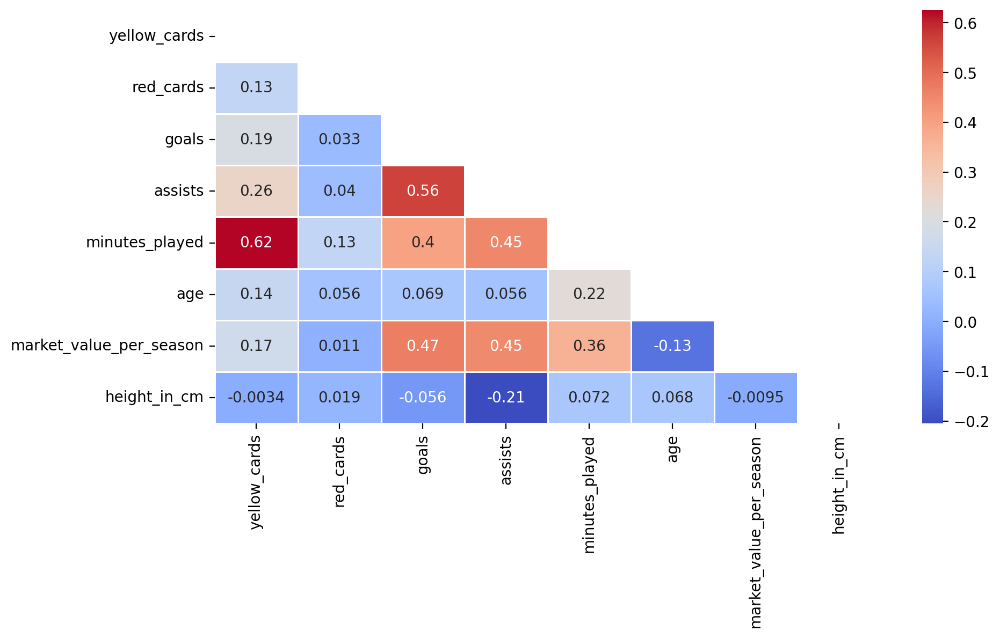

In [30]:
plt.figure(figsize=(10,5))

# 삼각형 마스크를 만든다(위 쪽 삼각형에 True, 아래 삼각형에 False)
mask = np.zeros_like(df_corr2, dtype=bool)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(df_corr2,
            annot=True,         # 실제 값을 표시한다
            mask=mask,          # 표시하지 않을 마스크 부분을 지정한다
            linewidths=.5,      # 경계면 실선으로 구분하기
            cmap='coolwarm')

### 상관관계 결과
- 강한 상관관계 (0.6 ~ 0.8)
    - `yellow_cards` - `minutes_played`
- 뚜렷한 상관관계 (0.4 ~ 0.6)
    - `goals` - `assists`
    - `goals` - `market_value_per_season`
    - `goals` - `minutes_played`
    - `assists` - `minutes_played`
    - `assists` - `market_value_per_season`
- 약한 상관관계 (0.2 ~ 0.4)
    - `market_value_per_season` - `minutes_played`
- 음의 상관관계 (-0.2 ~)
    - `assists` - `height_in_cm`

- 추후 머신러닝 모델링에 따라 컬럼 추가 제거 예정

In [31]:
df_deleted = df.drop(columns=["yellow_cards", "red_cards"], axis="columns")

# total_apps, highest_market_value, yellow_cards, red_cards 제거한 데이터프레임의 상관관계 확인

df_corr3 = df_deleted[df_deleted.select_dtypes(include=np.number).columns.tolist()].corr()

df_corr3.style.background_gradient()

,goals,assists,minutes_played,age,market_value_per_season,height_in_cm
goals,1.000000,0.564064,0.398572,0.068867,0.467943,-0.055791
assists,0.564064,1.000000,0.452416,0.056160,0.449170,-0.205136
minutes_played,0.398572,0.452416,1.000000,0.224305,0.364226,0.072072
age,0.068867,0.056160,0.224305,1.000000,-0.128118,0.068115
market_value_per_season,0.467943,0.449170,0.364226,-0.128118,1.000000,-0.009540
height_in_cm,-0.055791,-0.205136,0.072072,0.068115,-0.009540,1.000000


<Axes: >

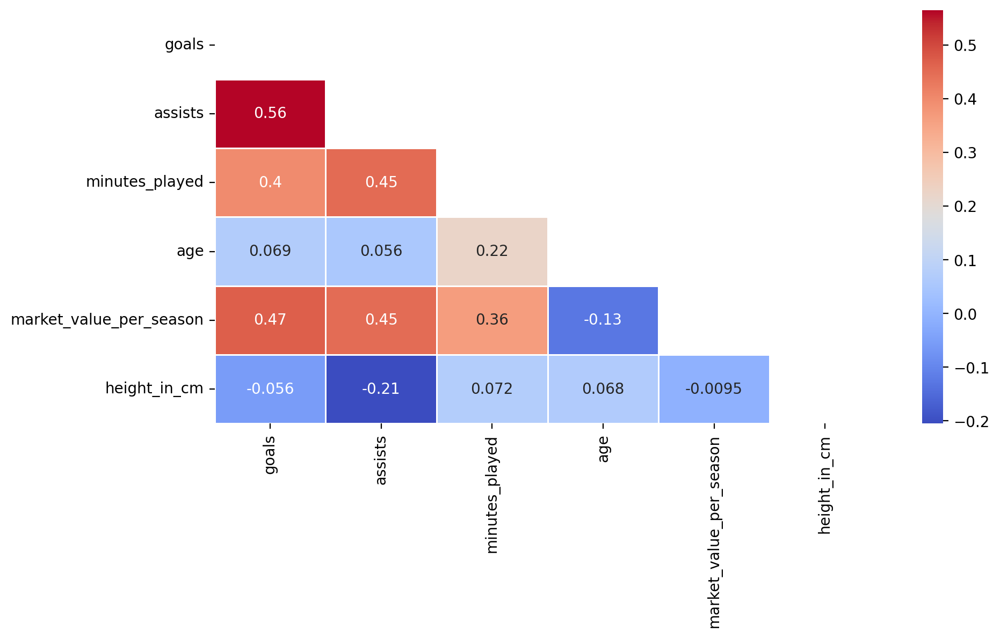

In [32]:
plt.figure(figsize=(10,5))

# 삼각형 마스크를 만든다(위 쪽 삼각형에 True, 아래 삼각형에 False)
mask = np.zeros_like(df_corr3, dtype=bool)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(df_corr3,
            annot=True,         # 실제 값을 표시한다
            mask=mask,          # 표시하지 않을 마스크 부분을 지정한다
            linewidths=.5,      # 경계면 실선으로 구분하기
            cmap='coolwarm')

## 가설 설정
- 선수의 몸값에 영향을 가장 많이 주는 것은 공격 포인트 (골 + 어시스트)일 것이다

- 나이와 포지션에 따라, 비슷한 스탯이라도 선수의 몸값은 다를 것이다
- 전체 선수들의 분포에 비해, 고가의 선수들 (100M 유로 이상)의 몸값 분포는 다를 것이다

## `column`별 분석

### `goals`, `assists` 분석

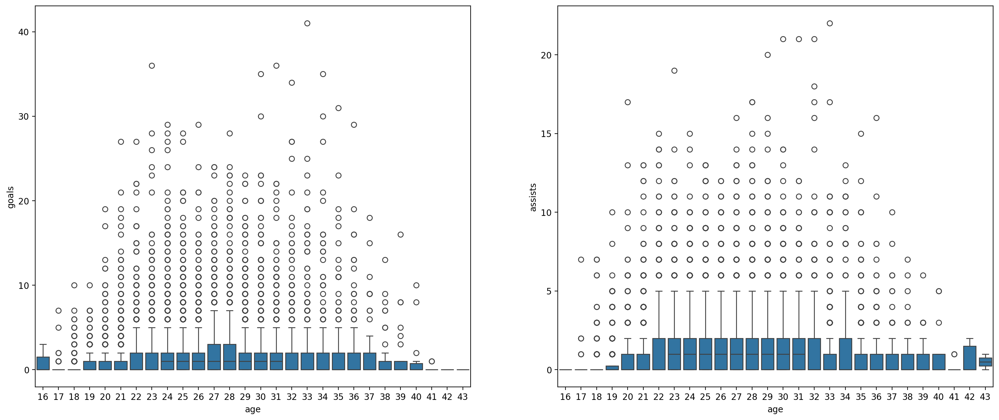

In [33]:
# boxplot 그려서 나이에 따른 골, 어시스트 확인
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 8))

# plt.figure(figsize=(15,8))
g1 = sns.boxplot(data=df, x="age", y="goals", ax=axes[0])
g2 = sns.boxplot(data=df, x="age", y="assists", ax=axes[1])

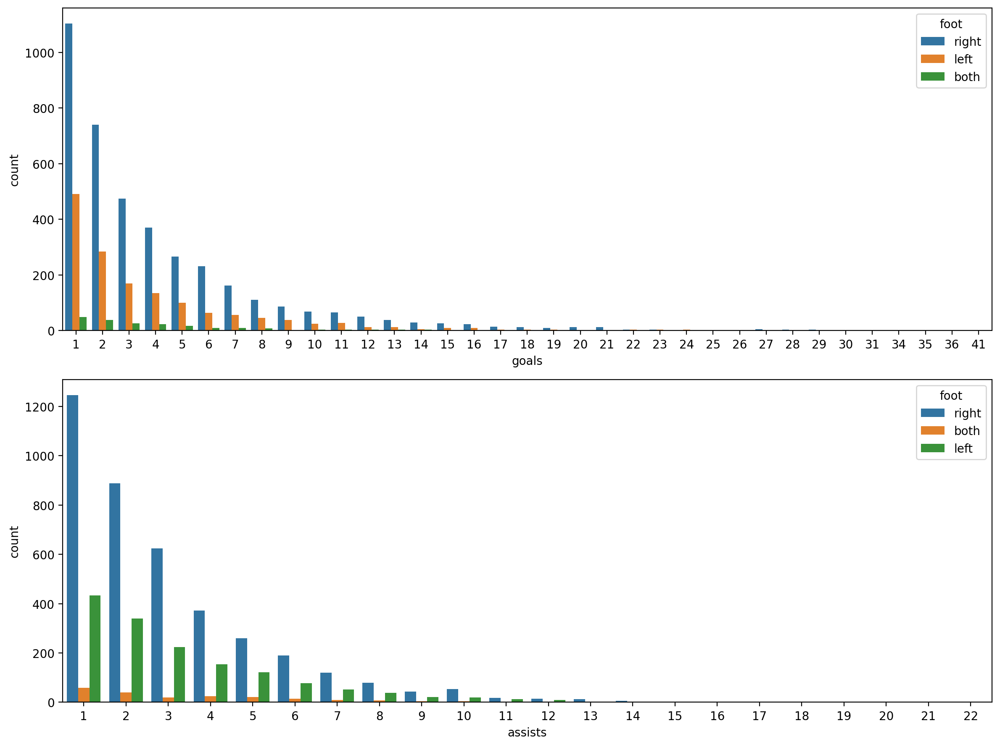

In [34]:
# countplot 그려서 골, 어시스트 숫자 확인
# 골, 어시스트 0인 선수 제외
goals_assists = ["goals", "assists"]
more_than_zero = (df.goals>0) & (df.assists>0)

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 9))

for col, ax in zip(goals_assists, axes):
    sns.countplot(data=df[more_than_zero], x=col, ax=ax, hue="foot")

fig.tight_layout()

plt.show()

In [35]:
# 41 득점한 선수 확인
df[df.goals==41]

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,age,position,current_club_name,market_value_per_season,country,foot,height_in_cm
13157,Robert Lewandowski,2020,4,0,41,7,2463,bundesliga,1988-08-21,33,Centre-Forward,FC Barcelona,60000000.0,Poland,right,185.0


In [36]:
# 22 어시스트한 선수 확인
df[df.assists==22]

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,age,position,current_club_name,market_value_per_season,country,foot,height_in_cm
8857,Lionel Messi,2019,4,0,25,22,2880,laliga,1987-06-24,33,Right Winger,Paris Saint-Germain,112000000.0,Argentina,left,170.0


#### 시즌별 Goals, Assists Top 5 확인

In [37]:
# func1 : 골 Top 5로 정렬
func1 = lambda g: g.sort_values(by="goals", ascending=False)[:5]

# func2 : 어시스트 Top 5로 정렬 
func2 = lambda g: g.sort_values(by="assists", ascending=False)[:5]

In [38]:
goal_top5 = df.groupby("start_season")[["player_name", "goals", "assists"]].apply(func1)
goal_top5.head()

player_name  goals  assists
start_season                                          
2019         2731        Ciro Immobile     35        8
             13156  Robert Lewandowski     34        4
             2891    Cristiano Ronaldo     31        6
             14980         Timo Werner     28        8
             8857         Lionel Messi     25       22

In [39]:
assist_top5 = df.groupby("start_season")[["player_name", "goals", "assists"]].apply(func2)
assist_top5.head()

player_name  goals  assists
start_season                                       
2019         8857      Lionel Messi     25       22
             14853    Thomas Müller      8       21
             8257   Kevin De Bruyne     13       20
             6462      Jadon Sancho     17       17
             9212      Luis Alberto      6       16

In [40]:
# goal_top5와 assist_top5를 합쳐 시즌별 골, 어시스트 top 5를 넣은 데이터프레임 생성
goals_assists_top5 = pd.concat([goal_top5, assist_top5]).reset_index()
goals_assists_top5.drop_duplicates(inplace=True)
goals_assists_top5

,start_season,level_1,player_name,goals,assists
0,2019,2731,Ciro Immobile,35,8
1,2019,13156,Robert Lewandowski,34,4
2,2019,2891,Cristiano Ronaldo,31,6
3,2019,14980,Timo Werner,28,8
4,2019,8857,Lionel Messi,25,22
5,2020,13157,Robert Lewandowski,41,7
6,2020,8858,Lionel Messi,30,11
7,2020,2892,Cristiano Ronaldo,29,2
8,2020,1154,André Silva,28,8
9,2020,4314,Erling Haaland,27,8


##### 시각화 (`plotly`)

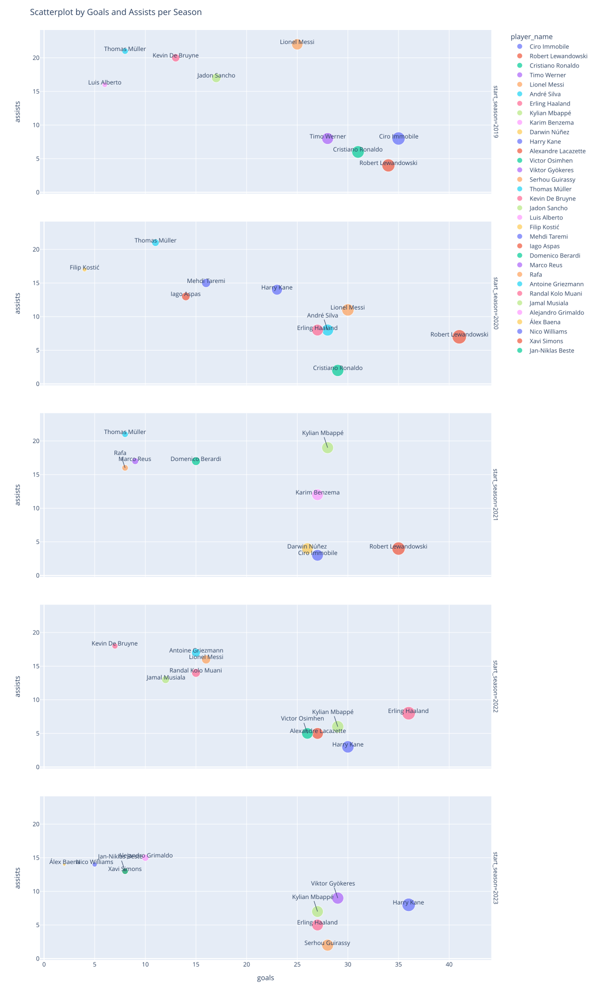

In [41]:
# plotly로 scatterplot 확인
import plotly.express as px

fig = px.scatter(data_frame=goals_assists_top5, x="goals", y="assists", color="player_name", 
                 size="goals", facet_row="start_season", 
                 width=1200, height=2000)

overlapped_names = ["André Silva", "Rafa", "Victor Osimhen", "Ollie Watkins",
                    "Leroy Sané", "Jan-Niklas Beste", "Viktor Gyökeres", "Kylian Mbappé"]

for i, season in enumerate(goals_assists_top5["start_season"].unique()):
    seasonal = goals_assists_top5[goals_assists_top5["start_season"] == season].reset_index(drop=True)
    
    i = (-1)*(i-5)

    for j in range(seasonal.shape[0]):
            if seasonal.loc[j, "player_name"] in overlapped_names:
                fig.add_annotation(x=seasonal.loc[j, "goals"], y=seasonal.loc[j, "assists"],
                                    text=seasonal.loc[j, "player_name"],
                                    # xanchor="left",
                                    # yanchor="bottom",
                                    showarrow=True,
                                    # yshift=22,
                                    #    arrowhead=0,
                                    row=i, col=1)
            else:
                fig.add_annotation(x=seasonal.loc[j, "goals"], y=seasonal.loc[j, "assists"],
                                   text=seasonal.loc[j, "player_name"],
                                   # xanchor="left",
                                   # yanchor="bottom",
                                   showarrow=False,
                                   yshift=5,
                                   #    arrowhead=0,
                                   row=i, col=1)

fig.update_layout(title_text="Scatterplot by Goals and Assists per Season")

fig.show()

#### 10경기 이상 뛴 선수들로 시즌별 Goals, Assists Top 5 확인

In [42]:
# 10경기라 900분 이상으로 필터링
df_over_10_games = df[df.minutes_played>=900]
df_over_10_games.head()

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,age,position,current_club_name,market_value_per_season,country,foot,height_in_cm
0,Aaron Connolly,2019,0,0,3,2,1261,premier-league,2000-01-28,20,Centre-Forward,Brighton & Hove Albion,4000000.0,Ireland,right,174.0
3,Aaron Cresswell,2019,7,0,3,0,2730,premier-league,1989-12-15,30,Left-Back,West Ham United,6500000.0,England,left,170.0
4,Aaron Cresswell,2020,3,0,0,8,3172,premier-league,1989-12-15,31,Left-Back,West Ham United,5000000.0,England,left,170.0
5,Aaron Cresswell,2021,3,0,2,3,2728,premier-league,1989-12-15,32,Left-Back,West Ham United,3000000.0,England,left,170.0
6,Aaron Cresswell,2022,2,0,0,1,2237,premier-league,1989-12-15,33,Left-Back,West Ham United,1200000.0,England,left,170.0


In [43]:
goal_10_games_top5= df_over_10_games.groupby("start_season")[["player_name", "goals", "assists"]].apply(func1)
goal_10_games_top5.head()

player_name  goals  assists
start_season                                          
2019         2731        Ciro Immobile     35        8
             13156  Robert Lewandowski     34        4
             2891    Cristiano Ronaldo     31        6
             14980         Timo Werner     28        8
             8857         Lionel Messi     25       22

In [44]:
assist_10_games_top5 = df_over_10_games.groupby("start_season")[["player_name", "goals", "assists"]].apply(func2)
assist_10_games_top5.head()

player_name  goals  assists
start_season                                       
2019         8857      Lionel Messi     25       22
             14853    Thomas Müller      8       21
             8257   Kevin De Bruyne     13       20
             6462      Jadon Sancho     17       17
             9212      Luis Alberto      6       16

In [45]:
goals_assists_10_games_top5 = pd.concat([goal_10_games_top5, assist_10_games_top5]).reset_index()
goals_assists_10_games_top5.drop_duplicates(inplace=True)
goals_assists_10_games_top5.sort_values(by=["start_season", "assists"], ascending=[True, False], inplace=True)

In [46]:
# 10경기 이상 뛴 선수 중 시즌별 골, 어시스트 top 5를 넣은 데이터프레임 생성
goals_assists_10_games_top5.reset_index(drop=True, inplace=True)

##### 시각화 (plotly)

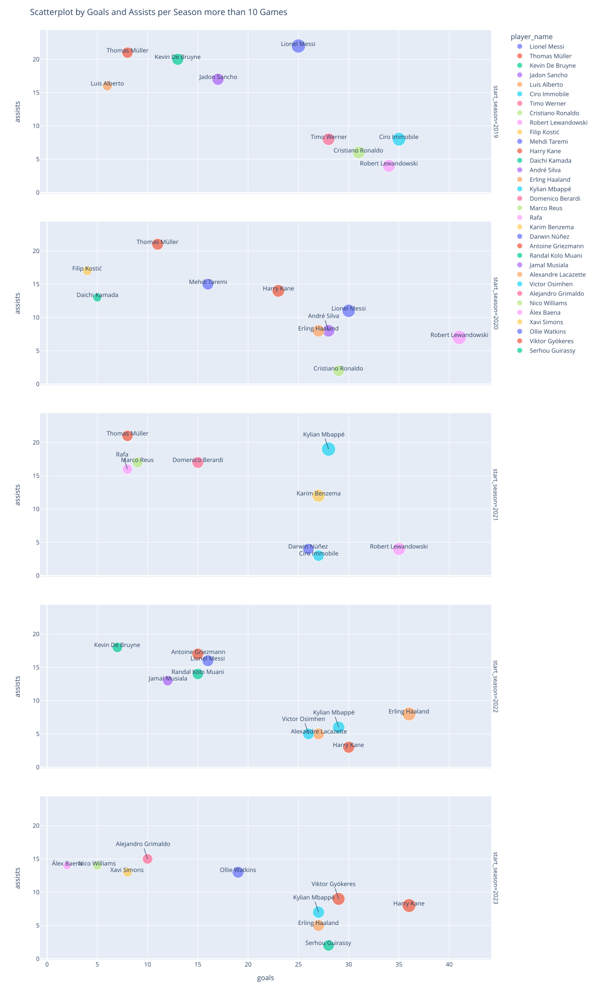

In [47]:
# plotly로 scatterplot 확인
import plotly.express as px

fig = px.scatter(data_frame=goals_assists_10_games_top5, x="goals", y="assists", color="player_name", 
                 size=goals_assists_10_games_top5["goals"]+goals_assists_10_games_top5["assists"], 
                 facet_row=goals_assists_10_games_top5["start_season"], 
                #  text=goals_assists_10_games_top5["player_name"],
                 width=1200, height=2000)


fig.update_layout(title_text="Scatterplot by Goals and Assists per Season more than 10 Games")


overlapped_names = ["André Silva", "Rafa", "Victor Osimhen", "Alejandro Grimaldo",
                    "Leroy Sané", "Jan-Niklas Beste", "Viktor Gyökeres", "Kylian Mbappé"]

for i, season in enumerate(goals_assists_10_games_top5["start_season"].unique()):
    seasonal = goals_assists_10_games_top5[goals_assists_10_games_top5["start_season"] == season].reset_index(drop=True)
    i = (-1)*(i-5)
    # print(seasonal)
    for j in range(seasonal.shape[0]):
        # print(seasonal.loc[j, "goals"])
            if seasonal.loc[j, "player_name"] in overlapped_names:
                fig.add_annotation(x=seasonal.loc[j, "goals"], y=seasonal.loc[j, "assists"],
                                    text=seasonal.loc[j, "player_name"],
                                    # xanchor="left",
                                    # yanchor="bottom",
                                    showarrow=True,
                                    # yshift=22,
                                    #    arrowhead=0,
                                    row=i, col=1)
            else:
                fig.add_annotation(x=seasonal.loc[j, "goals"], y=seasonal.loc[j, "assists"],
                                   text=seasonal.loc[j, "player_name"],
                                   # xanchor="left",
                                   # yanchor="bottom",
                                   showarrow=False,
                                   yshift=5,
                                   #    arrowhead=0,
                                   row=i, col=1)

fig.show()


### `market_value_per_season` 분석

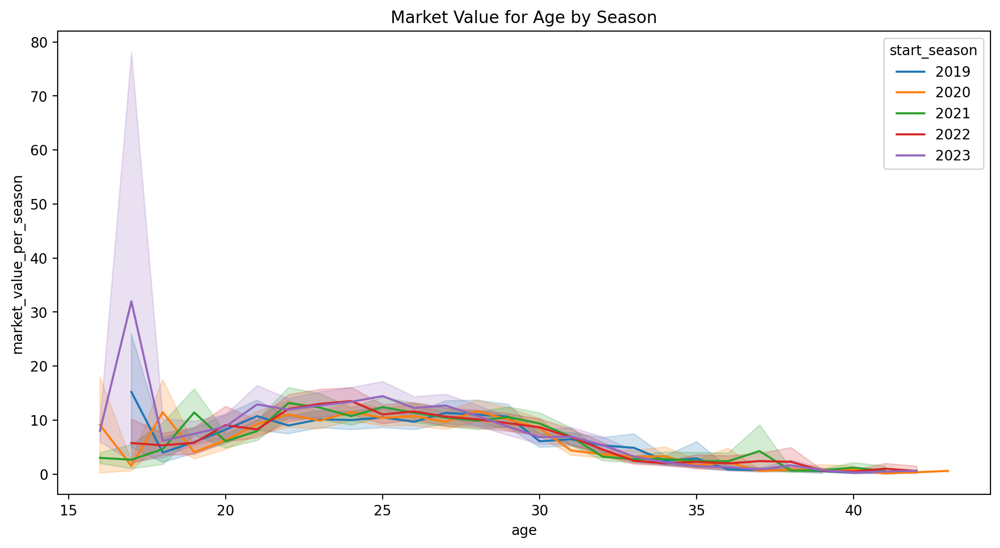

In [48]:
# 시즌, 연령에 따른 선수 몸값 변화

plt.figure(figsize=(12, 6))
sns.lineplot(data=df, x=df["age"], y=df["market_value_per_season"]/1000000, hue="start_season", estimator="mean")
plt.title("Market Value for Age by Season")
plt.show()

In [68]:
# 17세 이하 중 가장 높은 몸값 자랑하는 선수 확인 → Lamine Yamal

df[df.age<=17].sort_values("market_value_per_season", ascending=False).head(20)

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,age,position,current_club_name,market_value_per_season,country,foot,height_in_cm
8616,Lamine Yamal,2023,3,0,5,7,2196,laliga,2007-07-13,17,Right Winger,FC Barcelona,120000000.0,Spain,left,180.0
1233,Ansu Fati,2019,2,1,7,1,1027,laliga,2002-10-31,17,Left Winger,Brighton & Hove Albion,50000000.0,Spain,right,178.0
4015,Eduardo Camavinga,2019,4,0,1,2,2113,ligue-1,2002-11-10,17,Central Midfield,Real Madrid,37500000.0,France,left,182.0
12179,Pau Cubarsí,2023,4,0,0,0,1562,laliga,2007-01-22,17,Centre-Back,FC Barcelona,30000000.0,Spain,right,184.0
15614,Warren Zaïre-Emery,2022,1,0,2,0,917,ligue-1,2006-03-08,17,Central Midfield,Paris Saint-Germain,20000000.0,France,right,178.0
16023,Youssoufa Moukoko,2020,0,0,3,0,412,bundesliga,2004-11-20,16,Centre-Forward,Borussia Dortmund,18000000.0,Germany,left,179.0
12858,Rayan Cherki,2019,0,0,0,0,139,ligue-1,2003-08-17,17,Attacking Midfield,Olympique Lyon,18000000.0,France,both,180.0
16024,Youssoufa Moukoko,2021,1,0,2,2,210,bundesliga,2004-11-20,17,Centre-Forward,Borussia Dortmund,15000000.0,Germany,left,179.0
5454,Giovanni Reyna,2019,2,0,0,1,344,bundesliga,2002-11-13,17,Attacking Midfield,Nottingham Forest,15000000.0,United States,right,185.0
4925,Francesco Camarda,2023,0,0,0,0,12,serie-a,2008-03-10,16,Centre-Forward,AC Milan,10000000.0,Italy,both,184.0


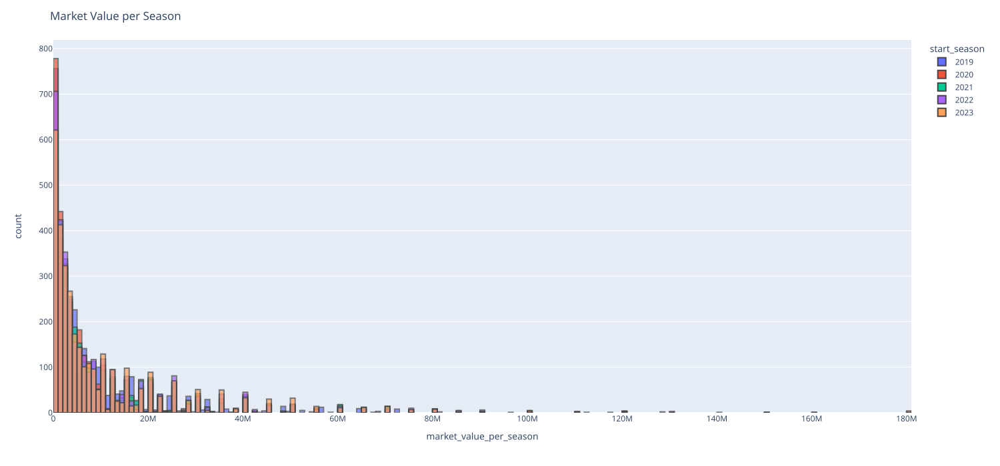

In [50]:
# 시즌별 선수 몸값
fig = px.histogram(data_frame=df, x="market_value_per_season", color="start_season",
                   width=1500, height=700)

fig.update_layout(barmode='overlay',  title_text="Market Value per Season")

fig.update_traces(marker_line_width=2, marker_opacity =0.7)

fig.show()

#### 20M 넘는 선수들로 확인

In [51]:
print("원본 df shape :", df.shape)
print("20M 유로 넘는 선수들 :", df[df.market_value_per_season >= 20000000].shape)

원본 df shape : (16360, 16)
20M 유로 넘는 선수들 : (2335, 16)


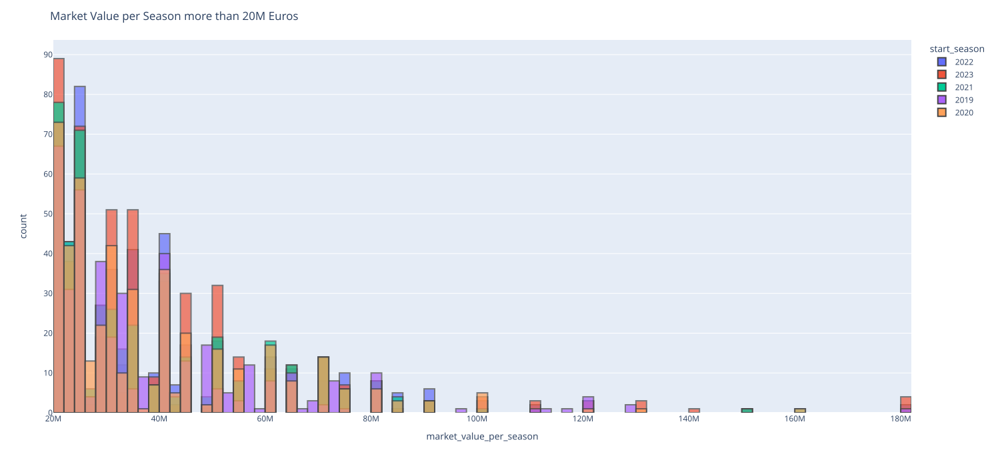

In [52]:
fig = px.histogram(data_frame=df[df.market_value_per_season >= 20000000], x="market_value_per_season", color="start_season",
                   width=1500, height=700)

fig.update_layout(barmode='overlay', title_text="Market Value per Season more than 20M Euros")

fig.update_traces(marker_line_width=2, marker_opacity =0.7)

fig.show()

#### 100M 유로 넘는 선수들 확인

In [53]:
df[df.market_value_per_season>=100000000].head(3)

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,age,position,current_club_name,market_value_per_season,country,foot,height_in_cm
1609,Aurélien Tchouaméni,2023,6,0,3,1,1986,laliga,2000-01-27,24,Defensive Midfield,Real Madrid,100000000.0,France,right,188.0
2252,Bukayo Saka,2022,6,0,14,11,3194,premier-league,2001-09-05,22,Right Winger,Arsenal FC,120000000.0,England,left,178.0
2253,Bukayo Saka,2023,4,0,16,9,2936,premier-league,2001-09-05,23,Right Winger,Arsenal FC,140000000.0,England,left,178.0


In [54]:
# 시장가치 100M 유로 넘는 선수들 확인

# 시장가치 100M 유로 넘는 선수들 중, player_name으로 groupby한 선수들의 market_value_per_season 최대값 중복해서 조회
mm = df[df.market_value_per_season>=100000000]
more_than_100 = mm.groupby("player_name", as_index=False).market_value_per_season.max().merge(mm)

# 득점, 어시스트 합산해서 공격포인트 (g+a) 컬럼 생성
more_than_100["g+a"] = more_than_100["goals"] + more_than_100["assists"]
more_than_100.sort_values("start_season", ascending=False).head(15)

,player_name,market_value_per_season,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,age,position,current_club_name,country,foot,height_in_cm,g+a
0,Aurélien Tchouaméni,100000000.0,2023,6,0,3,1,1986,laliga,2000-01-27,24,Defensive Midfield,Real Madrid,France,right,188.0,4
11,Jamal Musiala,130000000.0,2023,2,0,10,6,1767,bundesliga,2003-02-26,21,Attacking Midfield,Bayern Munich,Germany,right,184.0,16
27,Rodrygo,110000000.0,2023,2,0,10,5,2391,laliga,2001-01-09,23,Right Winger,Real Madrid,Brazil,right,174.0,15
26,Rodri,130000000.0,2023,8,1,8,9,2938,premier-league,1996-06-22,28,Defensive Midfield,Manchester City,Spain,right,191.0,17
24,Phil Foden,150000000.0,2023,2,0,19,8,2871,premier-league,2000-05-28,24,Right Winger,Manchester City,England,left,171.0,27
20,Martin Ødegaard,110000000.0,2023,2,0,8,10,3104,premier-league,1998-12-17,25,Attacking Midfield,Arsenal FC,Norway,left,178.0,18
18,Lautaro Martínez,110000000.0,2023,5,0,24,6,2667,serie-a,1997-08-22,27,Centre-Forward,Inter Milan,Argentina,right,174.0,30
17,Lamine Yamal,120000000.0,2023,3,0,5,7,2196,laliga,2007-07-13,17,Right Winger,FC Barcelona,Spain,left,180.0,12
1,Bukayo Saka,140000000.0,2023,4,0,16,9,2936,premier-league,2001-09-05,23,Right Winger,Arsenal FC,England,left,178.0,25
12,Jude Bellingham,180000000.0,2023,5,1,19,6,2324,laliga,2003-06-29,21,Attacking Midfield,Real Madrid,England,right,186.0,25


In [55]:
more_than_100 = more_than_100.sort_values("start_season")

##### Goals, Assists 시각화

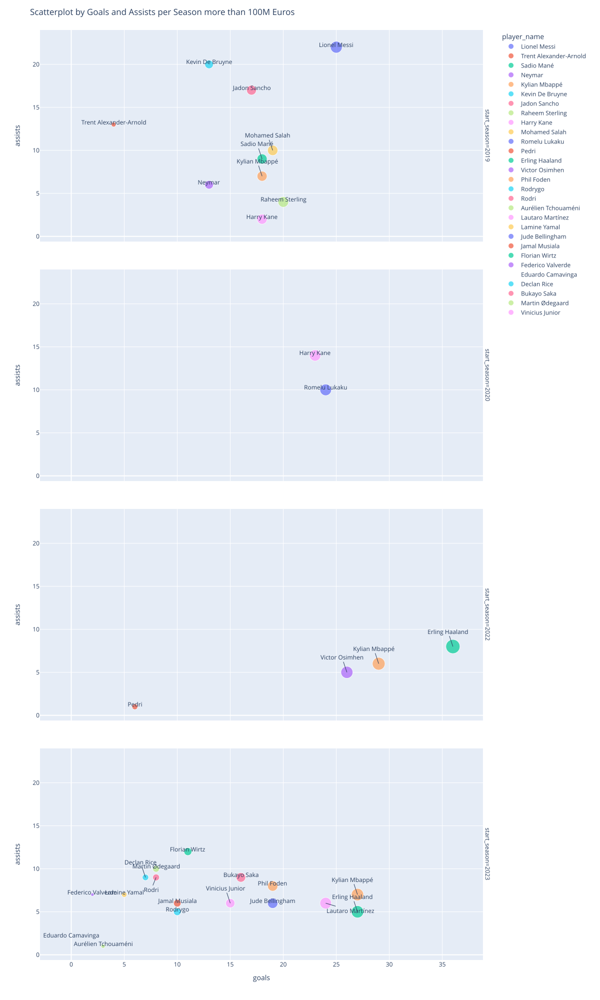

In [56]:
# plotly로 scatterplot 확인
import plotly.express as px

fig = px.scatter(data_frame=more_than_100, x="goals", y="assists", color="player_name", 
                 size="goals", facet_row="start_season", 
                #  text="player_name",
                 width=1200, height=2000)

fig.update_layout(title_text="Scatterplot by Goals and Assists per Season more than 100M Euros")
# fig.update_traces(textposition="top right")

overlapped_names = ["Vinicius Junior", "Sadio Mané", "Declan Rice", "Victor Osimhen", 
                    "Mohamed Salah", "Erling Haaland", "Kylian Mbappé"]
                    # "Phil Foden",Rodrygo"]

for i, season in enumerate(more_than_100["start_season"].unique()):
    seasonal = more_than_100[more_than_100["start_season"] == season].reset_index(drop=True)
    i = (-1)*(i-4)
    # print(seasonal)
    for j in range(seasonal.shape[0]):
        # print(seasonal.loc[j, "goals"])
            if seasonal.loc[j, "player_name"] in overlapped_names:
                fig.add_annotation(x=seasonal.loc[j, "goals"], y=seasonal.loc[j, "assists"],
                                    text=seasonal.loc[j, "player_name"],
                                    # xanchor="left",
                                    # yanchor="bottom",
                                    showarrow=True,
                                    ay=-30,
                                    # yshift=22,
                                    #    arrowhead=0,
                                    row=i, col=1)
                
            elif seasonal.loc[j, "player_name"] in ["Rodri"]:
                                                    # "Jamal Musiala"]:
                                 fig.add_annotation(x=seasonal.loc[j, "goals"], y=seasonal.loc[j, "assists"],
                                    text=seasonal.loc[j, "player_name"],
                                    # xanchor="left",
                                    # yanchor="bottom",
                                    showarrow=True,
                                    ay=25,
                                    # yshift=22,
                                    #    arrowhead=0,
                                    row=i, col=1)
            
            elif seasonal.loc[j, "player_name"] in ["Lautaro Martínez"]:
                                 fig.add_annotation(x=seasonal.loc[j, "goals"], y=seasonal.loc[j, "assists"],
                                    text=seasonal.loc[j, "player_name"],
                                    # xanchor="left",
                                    # yanchor="bottom",
                                    showarrow=True,
                                    ax=50,
                                    ay=15,
                                    # yshift=22,
                                    #    arrowhead=0,
                                    row=i, col=1)
                 
            else:
                fig.add_annotation(x=seasonal.loc[j, "goals"], y=seasonal.loc[j, "assists"],
                                   text=seasonal.loc[j, "player_name"],
                                   # xanchor="left",
                                   # yanchor="bottom",
                                   showarrow=False,
                                   yshift=5,
                                   #    arrowhead=0,
                                   row=i, col=1)

fig.show()

##### 공격포인트 합산 시각화

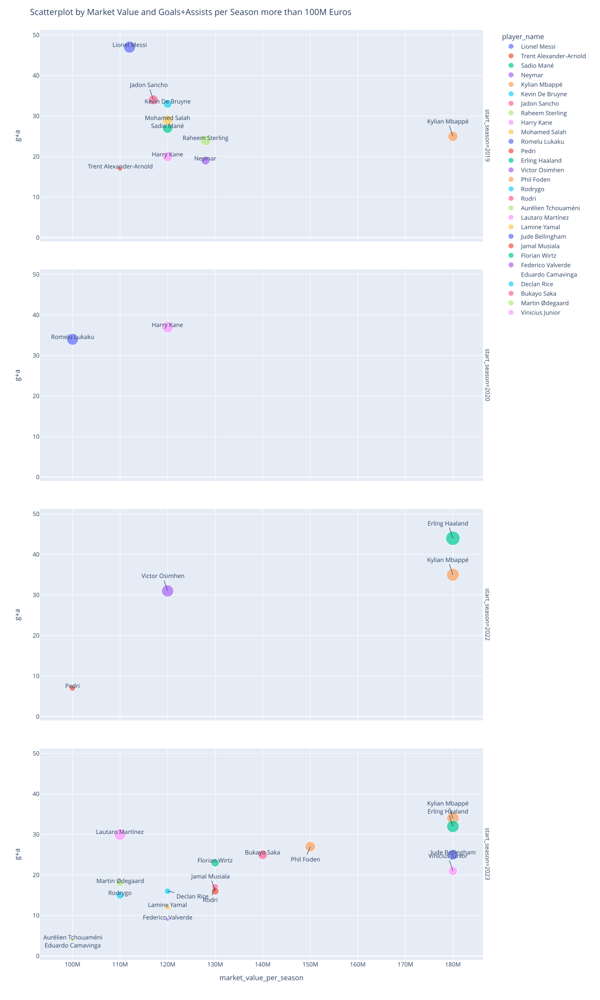

In [57]:
# 득점 + 어시스트 하나로 합친 공격포인트 시각화

# plotly로 scatterplot 확인
import plotly.express as px

fig = px.scatter(data_frame=more_than_100, x="market_value_per_season", y="g+a", color="player_name", 
                 size="goals", facet_row="start_season",
                #  text="player_name",
                 width=1200, height=2000)


overlapped_names = ["Jadon Sancho", "Jamal Musiala", "Victor Osimhen", 
                    "Vinicius Junior", "Erling Haaland", "Kylian Mbappé"]
                    # "Phil Foden",

for i, season in enumerate(more_than_100["start_season"].unique()):
    seasonal = more_than_100[more_than_100["start_season"] == season].reset_index(drop=True)
    i = (-1)*(i-4)
    # print(seasonal)
    for j in range(seasonal.shape[0]):
        # print(seasonal.loc[j, "goals"])
            if seasonal.loc[j, "player_name"] in overlapped_names:
                fig.add_annotation(x=seasonal.loc[j, "market_value_per_season"], y=seasonal.loc[j, "g+a"],
                                    text=seasonal.loc[j, "player_name"],
                                    # xanchor="left",
                                    # yanchor="bottom",
                                    showarrow=True,
                                    ay=-30,
                                    # yshift=22,
                                    #    arrowhead=0,
                                    row=i, col=1)
                
            elif seasonal.loc[j, "player_name"] in ["Rodri", "Phil Foden"]:
                                                    # "Rodrygo"]:
                                 fig.add_annotation(x=seasonal.loc[j, "market_value_per_season"], y=seasonal.loc[j, "g+a"],
                                    text=seasonal.loc[j, "player_name"],
                                    # xanchor="left",
                                    # yanchor="bottom",
                                    showarrow=True,
                                    # ax = 25,
                                    ay=25,
                                    # yshift=22,
                                    #    arrowhead=0,
                                    row=i, col=1)
            
            elif seasonal.loc[j, "player_name"] == "Declan Rice":
                                 fig.add_annotation(x=seasonal.loc[j, "market_value_per_season"], y=seasonal.loc[j, "g+a"],
                                    text=seasonal.loc[j, "player_name"],
                                    # xanchor="left",
                                    # yanchor="bottom",
                                    showarrow=True,
                                    ax = 50,
                                    ay=10,
                                    # yshift=22,
                                    #    arrowhead=0,
                                    row=i, col=1)
                 
            else:
                fig.add_annotation(x=seasonal.loc[j, "market_value_per_season"], y=seasonal.loc[j, "g+a"],
                                   text=seasonal.loc[j, "player_name"],
                                   # xanchor="left",
                                   # yanchor="bottom",
                                   showarrow=False,
                                   yshift=5,
                                   #    arrowhead=0,
                                   row=i, col=1)

fig.update_layout(title_text="Scatterplot by Market Value and Goals+Assists per Season more than 100M Euros")
# fig.update_traces(textposition="top center")
fig.show()

#### 포지션별 평균 market_value_per_season

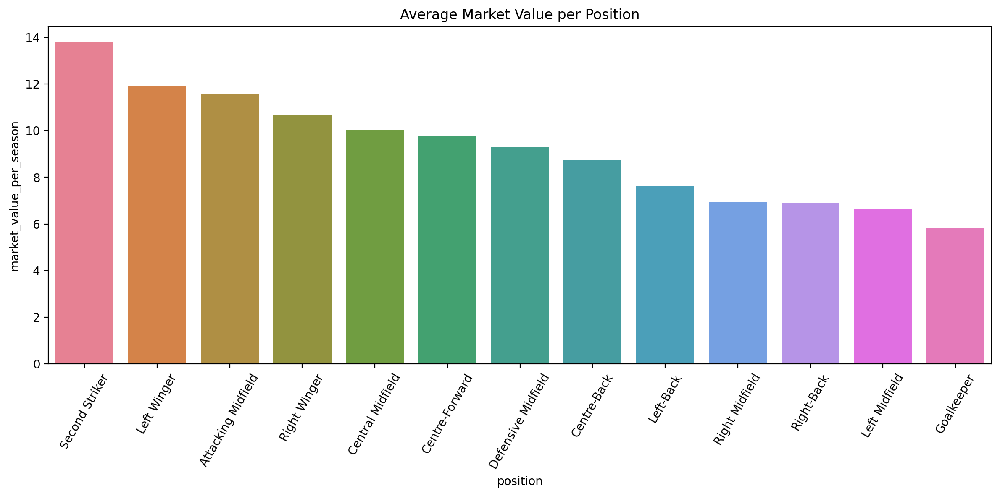

In [58]:
# Left Winger가 가장 평균 몸값이 비싸다
plt.figure(figsize=(12, 6))

per_position = df.groupby("position").mean("market_value_per_season").sort_values("market_value_per_season", ascending=False).reset_index()

g = sns.barplot(data=per_position, x="position", y=per_position["market_value_per_season"]/1000000,
                # dodge=False,
                hue="position")
g.set_xticklabels(g.get_xticklabels(), rotation=60)
plt.title("Average Market Value per Position")
plt.tight_layout()
plt.show()


In [59]:
# Left Winger 몸값 비싼 순위 Top 5
df[df.position=="Left Winger"].sort_values("market_value_per_season", ascending=False).head(5)

,player_name,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,age,position,current_club_name,market_value_per_season,country,foot,height_in_cm
15469,Vinicius Junior,2023,7,0,15,6,1875,laliga,2000-07-12,24,Left Winger,Real Madrid,180000000.0,Brazil,right,176.0
15468,Vinicius Junior,2022,10,1,10,10,2833,laliga,2000-07-12,23,Left Winger,Real Madrid,150000000.0,Brazil,right,176.0
11447,Neymar,2019,4,0,13,6,1322,ligue-1,1992-02-05,28,Left Winger,Paris Saint-Germain,128000000.0,Brazil,right,175.0
12774,Raheem Sterling,2019,5,0,20,4,2660,premier-league,1994-12-08,25,Left Winger,Chelsea FC,128000000.0,England,right,170.0
13710,Sadio Mané,2019,3,0,18,9,2755,premier-league,1992-04-10,28,Left Winger,Bayern Munich,120000000.0,Senegal,right,174.0


### `Age` 분석

#### 전체, 20M 유로 이상, 100M 유로 이상 몸값인 선수들끼리 비교

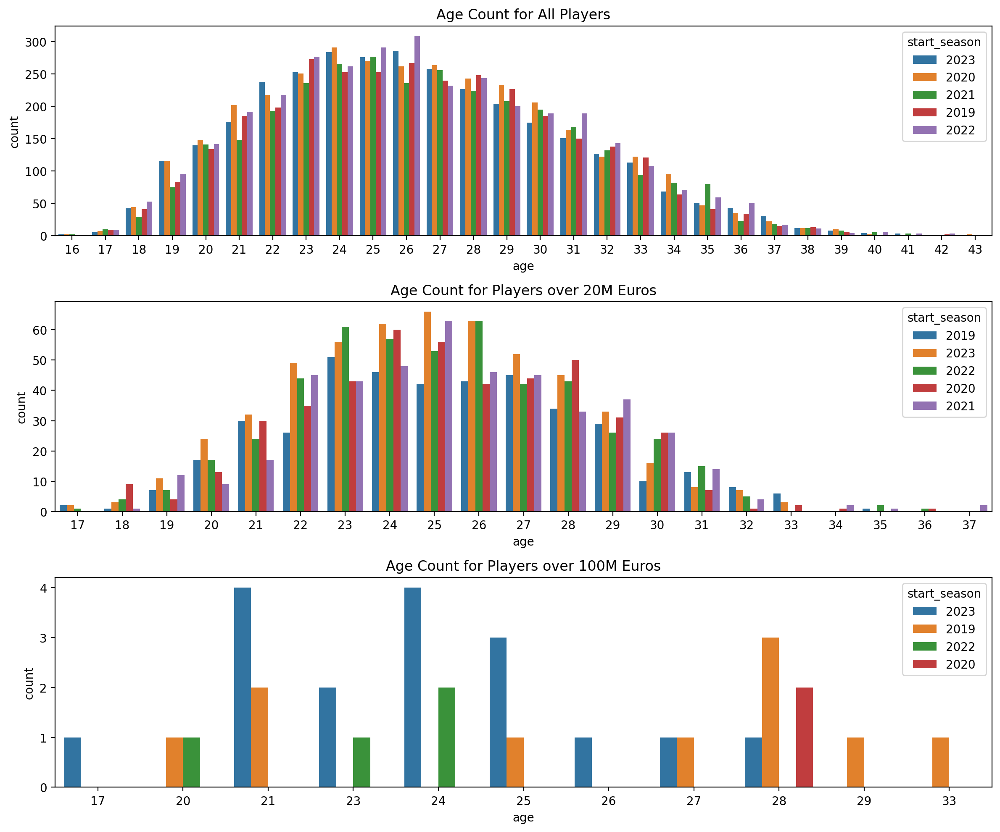

In [60]:
nrows, ncols = 3, 1
fig, axes = plt.subplots(nrows, ncols, figsize=(12, 10))

hue_order = [2019, 2020, 2021, 2022, 2023]
# flatten()을 통해axes를 1차원 array로 펴줘야 한다
# axes = axes.T.flatten()

g1 = sns.countplot(data=df, x="age", hue="start_season", ax=axes[0])
g2 = sns.countplot(data=df[df.market_value_per_season >= 20000000], x="age", hue="start_season", ax=axes[1])
g3 = sns.countplot(data=more_than_100, x="age", hue="start_season", ax=axes[2])

g1.set_title("Age Count for All Players")
g2.set_title("Age Count for Players over 20M Euros")
g3.set_title("Age Count for Players over 100M Euros")

plt.tight_layout()
plt.show()


##### 100M 유로 넘는 선수들 공격포인트와 `age` 비교

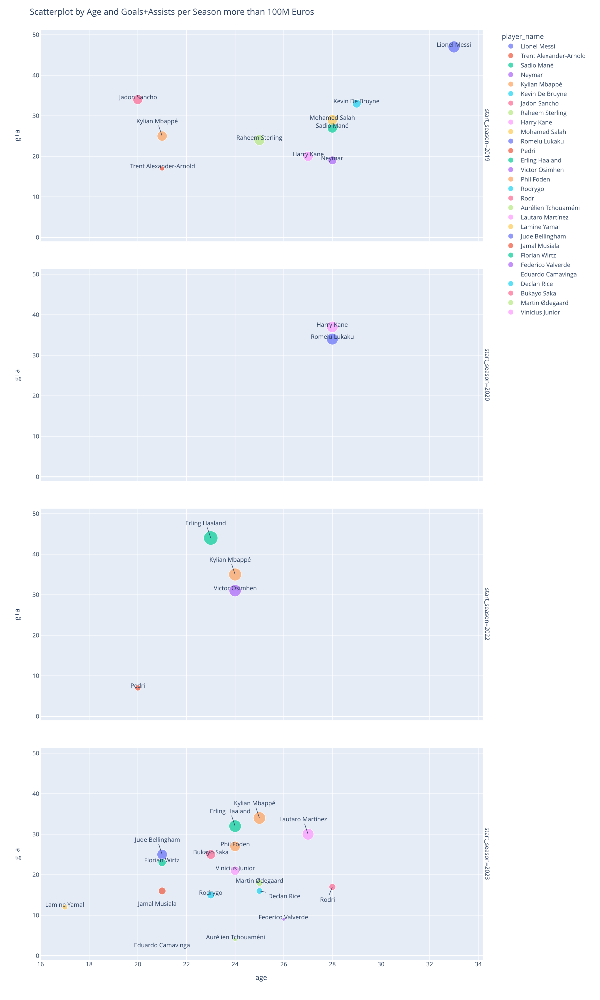

In [61]:
# 득점 + 어시스트 하나로 합친 공격포인트 시각화

# plotly로 scatterplot 확인
import plotly.express as px

fig = px.scatter(data_frame=more_than_100, x="age", y="g+a", color="player_name", 
                 size="goals", facet_row="start_season",
                #  text="player_name",
                 width=1200, height=2000)


overlapped_names = ["Erling Haaland", "Kylian Mbappé", "Lautaro Martínez", "Jude Bellingham"]

for i, season in enumerate(more_than_100["start_season"].unique()):
    seasonal = more_than_100[more_than_100["start_season"] == season].reset_index(drop=True)
    i = (-1)*(i-4)
    # print(seasonal)
    for j in range(seasonal.shape[0]):
        # print(seasonal.loc[j, "goals"])
            if seasonal.loc[j, "player_name"] in overlapped_names:
                fig.add_annotation(x=seasonal.loc[j, "age"], y=seasonal.loc[j, "g+a"],
                                    text=seasonal.loc[j, "player_name"],
                                    # xanchor="left",
                                    # yanchor="bottom",
                                    showarrow=True,
                                    ay=-30,
                                    # yshift=22,
                                    #    arrowhead=0,
                                    row=i, col=1)
                
            elif seasonal.loc[j, "player_name"] in ["Rodri", "Jamal Musiala"]:
                                 fig.add_annotation(x=seasonal.loc[j, "age"], y=seasonal.loc[j, "g+a"],
                                    text=seasonal.loc[j, "player_name"],
                                    # xanchor="left",
                                    # yanchor="bottom",
                                    showarrow=True,
                                    # ax = 25,
                                    ay=25,
                                    # yshift=22,
                                    #    arrowhead=0,
                                    row=i, col=1)
            
            elif seasonal.loc[j, "player_name"] in ["Declan Rice"]:
                                 fig.add_annotation(x=seasonal.loc[j, "age"], y=seasonal.loc[j, "g+a"],
                                    text=seasonal.loc[j, "player_name"],
                                    # xanchor="left",
                                    # yanchor="bottom",
                                    showarrow=True,
                                    ax = 50,
                                    ay=10,
                                    # yshift=22,
                                    #    arrowhead=0,
                                    row=i, col=1)
                 
            else:
                fig.add_annotation(x=seasonal.loc[j, "age"], y=seasonal.loc[j, "g+a"],
                                   text=seasonal.loc[j, "player_name"],
                                   # xanchor="left",
                                   # yanchor="bottom",
                                   showarrow=False,
                                   yshift=5,
                                   #    arrowhead=0,
                                   row=i, col=1)

fig.update_layout(title_text="Scatterplot by Age and Goals+Assists per Season more than 100M Euros")
fig.update_traces(textposition="top center")
fig.show()

##### 100M 유로 넘는 선수들 `market_value_per_season`과 `age` 비교

In [62]:
more_than_100

,player_name,market_value_per_season,start_season,yellow_cards,red_cards,goals,assists,minutes_played,competition_code,date_of_birth,age,position,current_club_name,country,foot,height_in_cm,g+a
19,Lionel Messi,112000000.0,2019,4,0,25,22,2880,laliga,1987-06-24,33,Right Winger,Paris Saint-Germain,Argentina,left,170.0,47
30,Trent Alexander-Arnold,110000000.0,2019,5,0,4,13,3176,premier-league,1998-10-07,21,Right-Back,Liverpool FC,England,right,180.0,17
29,Sadio Mané,120000000.0,2019,3,0,18,9,2755,premier-league,1992-04-10,28,Left Winger,Bayern Munich,Senegal,right,174.0,27
22,Neymar,128000000.0,2019,4,0,13,6,1322,ligue-1,1992-02-05,28,Left Winger,Paris Saint-Germain,Brazil,right,175.0,19
14,Kylian Mbappé,180000000.0,2019,0,0,18,7,1515,ligue-1,1998-12-20,21,Centre-Forward,Paris Saint-Germain,France,right,178.0,25
13,Kevin De Bruyne,120000000.0,2019,3,0,13,20,2800,premier-league,1991-06-28,29,Attacking Midfield,Manchester City,Belgium,right,181.0,33
10,Jadon Sancho,117000000.0,2019,2,0,17,17,2292,bundesliga,2000-03-25,20,Left Winger,Borussia Dortmund,England,right,180.0,34
25,Raheem Sterling,128000000.0,2019,5,0,20,4,2660,premier-league,1994-12-08,25,Left Winger,Chelsea FC,England,right,170.0,24
8,Harry Kane,120000000.0,2019,4,0,18,2,2590,premier-league,1993-07-28,27,Centre-Forward,Bayern Munich,England,right,188.0,20
21,Mohamed Salah,120000000.0,2019,1,0,19,10,2888,premier-league,1992-06-15,28,Right Winger,Liverpool FC,Egypt,left,175.0,29


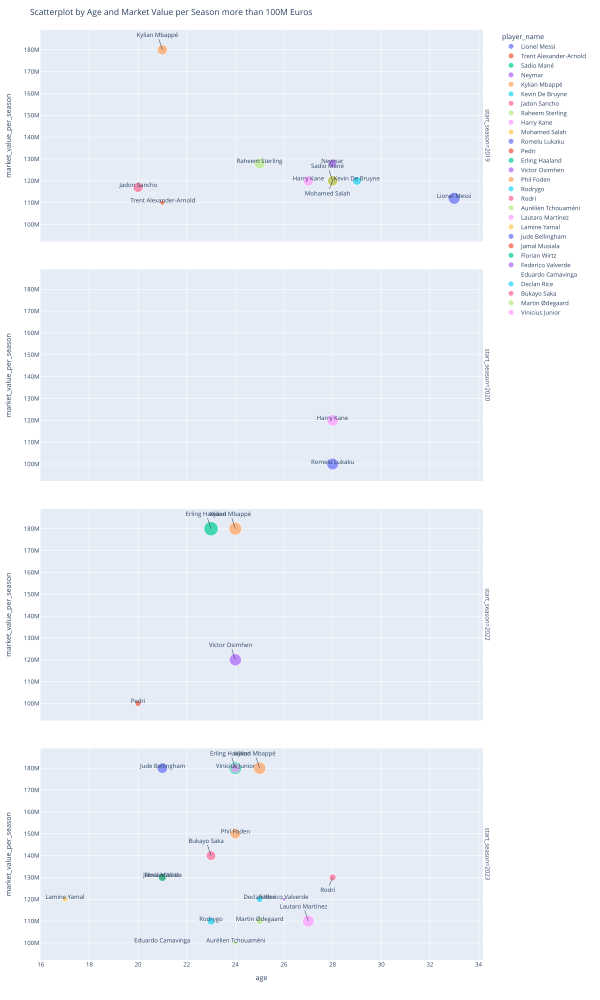

In [63]:
# 나이에 따른 market_value_per_season 시각화

# plotly로 scatterplot 확인
import plotly.express as px

fig = px.scatter(data_frame=more_than_100, x="age", y="market_value_per_season",
                 color="player_name", 
                 size="goals", facet_row="start_season",
                #  text="player_name",
                 width=1200, height=2000)

overlapped_names = ["Victor Osimhen", "Erling Haaland", "Kylian Mbappé", "Lautaro Martínez", "Sadio Mané", "Bukayo Saka"]

for i, season in enumerate(more_than_100["start_season"].unique()):
    seasonal = more_than_100[more_than_100["start_season"] == season].reset_index(drop=True)
    i = (-1)*(i-4)
    # print(seasonal)
    for j in range(seasonal.shape[0]):
        # print(seasonal.loc[j, "goals"])
            if seasonal.loc[j, "player_name"] in overlapped_names:
                fig.add_annotation(x=seasonal.loc[j, "age"], y=seasonal.loc[j, "market_value_per_season"],
                                    text=seasonal.loc[j, "player_name"],
                                    # xanchor="left",
                                    # yanchor="bottom",
                                    showarrow=True,
                                    ay=-30,
                                    # yshift=22,
                                    #    arrowhead=0,
                                    row=i, col=1)
                
            elif seasonal.loc[j, "player_name"] in ["Rodri", "Mohamed Salah"]:
                                 fig.add_annotation(x=seasonal.loc[j, "age"], y=seasonal.loc[j, "market_value_per_season"],
                                    text=seasonal.loc[j, "player_name"],
                                    # xanchor="left",
                                    # yanchor="bottom",
                                    showarrow=True,
                                    # ax = 25,
                                    ay=25,
                                    # yshift=22,
                                    #    arrowhead=0,
                                    row=i, col=1)

            else:
                fig.add_annotation(x=seasonal.loc[j, "age"], y=seasonal.loc[j, "market_value_per_season"],
                                   text=seasonal.loc[j, "player_name"],
                                   # xanchor="left",
                                   # yanchor="bottom",
                                   showarrow=False,
                                   yshift=5,
                                   #    arrowhead=0,
                                   row=i, col=1)

fig.update_layout(title_text="Scatterplot by Age and Market Value per Season more than 100M Euros")
# fig.update_traces(textposition="top center")
fig.show()

## EDA 정리

- 데이터 특징
    - 다양한 컬럼에서 많은 이상치 존재
        - 그러나 축구라는 스포츠의 특성 상, 득점, 도움, 시장 가치 등 몇몇의 특출난 선수들의 스탯이 도드라지게 나타난다
    - 결론 : 이상치 따로 처리하지 않음

- 상관관계
    - 다중 공선성 체크
    - 상관관계 높은 컬럼들 존재 → 추후 머신러닝 모델링에 따라 추가 제거 고민

- 컬럼별 분석
    - `goals`, `assists`
        - 19세 ~ 35세 까지 분포가 많다
        - 나이에 따라 비슷하게 이상치 존재
        - 시각화 결과
            - 시즌별 (5년간) 득점, 어시스트 특화된 순수들이 대다수
            - 시즌에 따라 간혹, 득점, 어시스트 전부 다 많이 기록하는 선수들 존재한다 (Mbappe, Messi 등)
    - `market_value_per_season`
        - 나이별 몸값은 시즌에 따라 보통 비슷하게 나타난다
            - outlier : 2023 시즌 16세 → Lamine Yamal
        - 몸값 `100M 유로` 넘는 선수들 (고가의 선수)만 따로 한번 더 시각화
            - `goals`, `assists`
                - 몸값 높은 선수들은 보통 득점이 많거나 어시스트가 많다
                    - 간혹 둘 다 높은 선수도 존재
            - `goals` + `assists` 합산한 공격포인트 확인
                - 공격포인트 높은 선수가 비싸다
                - 하지만 비슷한 공격포인트를 기록해도 몸값이 차이나는 선수들 존재
        - 포지션별 몸값은 `Left Winger`가 가장 높다
            - 2번째는 `Second Striker`, 3번째는 `Attacking Midfield`, 마지막은 `Goalkeeper`
    - `age`
        - 시즌별 전체 선수, 몸값 20M 유로 넘는 선수, 몸값 100M 유로 넘는 선수 분포 비교 → 분포 비슷하다
        - 몸값 `100M 유로` 넘는 선수들 (고가의 선수)만 따로 한번 더 시각화
            - `age`, `goals` + `assists` 합산한 공격포인트
                - 시즌별로 나이에 따라 공격포인트가 증가하는 모습을 보임
                - 포지션에 따라 공격포인트가 적을 수도 있음 (ex. Rice, Rodri : Defensive Midfield)
            - `age`, `market_value_per_season`
                - 시간이 지날 수록 나이 어린 선수들이 주로 높은 몸값 기록 (Bellingham, Haaland, Mbappe, Vinicius 등)
                    - Outlier : 1920 시즌 Messi        




## EDA 거친 데이터셋 `csv`로 저장

In [64]:
# 상관관계 높은 컬럼 ("yellow_cards", "red_cards") 삭제한 데이터셋 
df_deleted = df.drop(columns=["yellow_cards", "red_cards"], axis="columns")
df_deleted.head()

,player_name,start_season,goals,assists,minutes_played,competition_code,date_of_birth,age,position,current_club_name,market_value_per_season,country,foot,height_in_cm
0,Aaron Connolly,2019,3,2,1261,premier-league,2000-01-28,20,Centre-Forward,Brighton & Hove Albion,4000000.0,Ireland,right,174.0
1,Aaron Connolly,2020,2,1,791,premier-league,2000-01-28,21,Centre-Forward,Brighton & Hove Albion,7000000.0,Ireland,right,174.0
2,Aaron Connolly,2021,0,0,155,premier-league,2000-01-28,22,Centre-Forward,Brighton & Hove Albion,6000000.0,Ireland,right,174.0
3,Aaron Cresswell,2019,3,0,2730,premier-league,1989-12-15,30,Left-Back,West Ham United,6500000.0,England,left,170.0
4,Aaron Cresswell,2020,0,8,3172,premier-league,1989-12-15,31,Left-Back,West Ham United,5000000.0,England,left,170.0


In [65]:
# 상관관계 높은 컬럼 ("yellow_cards", "red_cards") 삭제한 데이터셋을 df_eda.csv로 저장
df_deleted.to_csv("data/df_eda.csv", index=False)

In [66]:
# 컬럼 삭제하지 않은 데이터셋을 df_eda_no_del.csv로 저장
df.to_csv("data/df_eda_no_del.csv", index=False)